## $A_{N \times M} = W_{N \times k} H_{k \times M}$
### Size of $A = O(NM)$
### Size of $W$ and $H = O(Nk) + O(kM) = O(k(N + M))$
### Hence $k \le \frac{NM}{N + M}$ for better space optimization when storing the original tensor $A_{N \times M}$ as factorized tensors $W_{N \times k}$ and $H_{k \times M}$
### Hence the low-rank factorization of A greatly reduces the space complexity and we here explore if this factorization really produces a good result or not

In [3]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import numpy as np
import random
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.image import imsave
from latex import latexify, format_axes
try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
%config InlineBackend.figure_format = "retina"

if torch.backends.mps.is_available():
    device = torch.device("mps")
elif torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(device)

cuda


In [ ]:
!sudo apt install cm-super dvipng texlive-latex-extra texlive-latex-recommended

In [5]:
def save_reconstructed_image(outputs, save_path):
  outputs = outputs.cpu().numpy().clip(0, 1)
  outputs = (outputs * 255).astype(np.uint8)
  pil_image = Image.fromarray(outputs)
  pil_image.save(save_path)

In [6]:
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


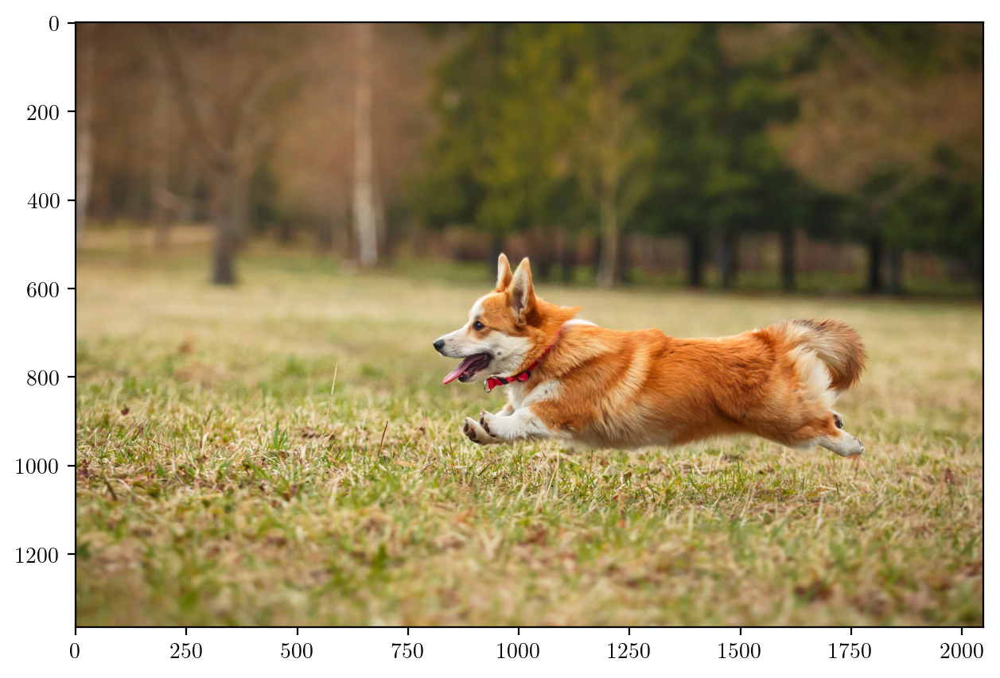

In [7]:
latexify(columns = 2, fig_width = 8)
plt.imshow(rearrange(img, "c h w -> h w c").numpy())
plt.show()

In [8]:
img = transforms.functional.crop(img.cpu(), 600, 800, 300, 300)
print(img.shape)

torch.Size([3, 300, 300])


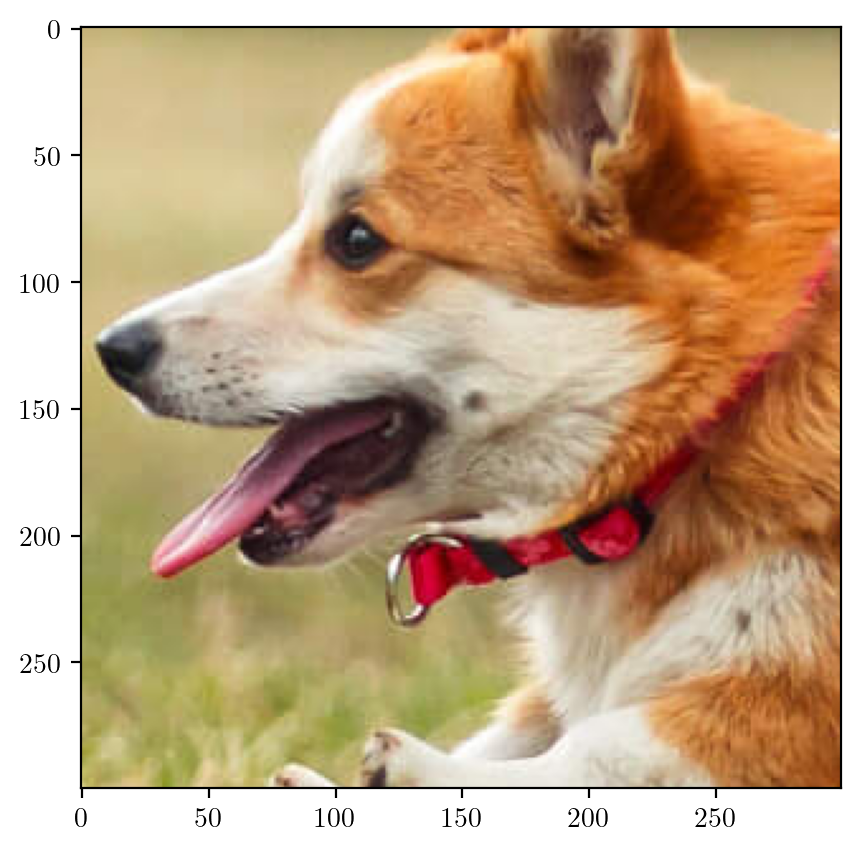

In [9]:
latexify(columns = 2, fig_width = 8)
plt.imshow(rearrange(img, "c h w -> h w c").numpy())
plt.show()

In [10]:
scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape
img_scaled = torch.tensor(img_scaled)
img_scaled = img_scaled.to(device, dtype = torch.float32)
img_scaled

tensor([[[0.7686, 0.7686, 0.7686,  ..., 0.5451, 0.5451, 0.5412],
         [0.7725, 0.7725, 0.7725,  ..., 0.5686, 0.5686, 0.5647],
         [0.7765, 0.7765, 0.7765,  ..., 0.5882, 0.5843, 0.5843],
         ...,
         [0.7961, 0.7373, 0.7176,  ..., 0.5843, 0.5725, 0.5490],
         [0.8471, 0.7843, 0.7451,  ..., 0.6039, 0.5686, 0.5569],
         [0.8784, 0.8196, 0.7686,  ..., 0.6275, 0.5804, 0.5686]],

        [[0.6941, 0.6941, 0.6941,  ..., 0.5137, 0.5137, 0.5098],
         [0.6980, 0.6980, 0.6980,  ..., 0.5255, 0.5255, 0.5216],
         [0.7020, 0.7020, 0.7020,  ..., 0.5451, 0.5412, 0.5412],
         ...,
         [0.7686, 0.7098, 0.6863,  ..., 0.2824, 0.2706, 0.2431],
         [0.8157, 0.7569, 0.7137,  ..., 0.3059, 0.2667, 0.2431],
         [0.8431, 0.7882, 0.7333,  ..., 0.3294, 0.2706, 0.2588]],

        [[0.4745, 0.4745, 0.4745,  ..., 0.3294, 0.3294, 0.3255],
         [0.4784, 0.4784, 0.4784,  ..., 0.3451, 0.3451, 0.3412],
         [0.4824, 0.4824, 0.4824,  ..., 0.3647, 0.3608, 0.

In [11]:
def remove_patch(img, Corner, d, display = True):
    X, Y = Corner
    latexify(columns = 2, fig_width = 10)
    img_copy = img.clone()
    img_copy[:, X : X + d, Y : Y + d] = float("nan")
    crop = transforms.functional.crop(img.cpu(), X, Y, d, d)
    fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [img.shape[2] / (5 * d), 1]})
    fig.suptitle(fr"Patch size = $({d} \times {d})$ removed", fontsize = 16)
    ax[0].imshow(rearrange(img_copy, 'c h w -> h w c').cpu().numpy())
    ax[0].set_title("Masked Image")
    ax[1].imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
    ax[1].set_title("Masked Crop")
    if (display):
        plt.show()
    else:
        plt.close()
    return img_copy, crop

#### $$ \text{PSNR} = 20 \log_{10}(\frac{\text{MAX}_I}{\sqrt{\text{MSE}}})$$

In [12]:
def metrics(img1, img2, max_value = 1.0):
  rmse = torch.sqrt(F.mse_loss(img1, img2))
  psnr_value = 20 * torch.log10(max_value / rmse)
  return rmse, psnr_value.item()

## Gradient Descent using Adam Optimizer $A_{N \times M} \approx W_{N \times k} H_{k \times M}$

In [13]:
def factorize(Img, k, convergence, device = torch.device("cpu")):
  """Factorize the matrix D into A and B"""
  Img = Img.to(device)
  losses, images = [], []
  for channel in range(Img.shape[0]):
      A = Img[channel]

      torch.manual_seed(42)
      W = torch.randn(A.shape[0], k, requires_grad = True, device = device)
      H = torch.randn(k, A.shape[1], requires_grad = True, device = device)

      optimizer = optim.Adam([W, H], lr = 0.02)
      mask = ~torch.isnan(A)
      prev_loss = float('inf')
      for i in range(10000):

          diff_matrix = torch.mm(W, H) - A
          diff_vector = diff_matrix[mask]
          loss = torch.norm(diff_vector)

          if torch.abs(prev_loss - loss) < convergence:
              break

          optimizer.zero_grad()

          loss.backward()

          optimizer.step()

          prev_loss = loss.item()

      losses.append(loss)
      images.append(torch.mm(W, H))

  return losses, torch.stack([images[0], images[1], images[2]], dim = 0), i

## Function for Training and Plotting the Reconstructed Image

In [14]:
def train_reconstruct_plot_patch(img, Corner, d, features, convergence, device, allowSave = False, FileName = None, allowMetrics = False):
  imgSingle, croppedSingle = remove_patch(img, Corner, d, display = False)
  losses, croppedRestruct, i = factorize(croppedSingle, features, convergence, device)
  croppedSingle = croppedSingle.to(device)
  new_image = imgSingle.clone()
  X, Y = Corner
  new_image[:, X : X + d, Y : Y + d] = croppedRestruct
  rmse, psnr = metrics(img, new_image)
  rmse_, psnr_ = metrics(croppedRestruct, croppedSingle)
  latexify(columns = 2)
  fig, ax = plt.subplots(nrows = 1, ncols = 3, gridspec_kw = {"width_ratios": [1, 1, 1]}, figsize = (15, 7))
  fig.suptitle(f"RMSE_Overall : {rmse} | PNSR_overall : {psnr}" "\n" fr"Crop Corner = $({X}, {Y})$" "\n" f"Features = {features}" "\n" fr"Loss Red = {losses[0]}, Loss Green = {losses[0]}, Loss Blue = {losses[2]}" "\n" f"Converged after {i} iteration", fontsize = 12)
  ax[0].imshow(rearrange(img, 'c h w -> h w c').cpu().numpy())
  ax[0].set_title("Original Image" "\n" rf"$({img.shape[1]} \times {img.shape[2]})$")
  ax[1].imshow(rearrange(imgSingle, 'c h w -> h w c').cpu().numpy())
  ax[1].set_title("Masked Image")
  ax[2].imshow(rearrange(new_image, 'c h w -> h w c').cpu().detach().numpy())
  ax[2].set_title("Reconstructed Image" "\n" rf"$({img.shape[1]} \times {img.shape[2]})$")
  if (allowSave):
      save_reconstructed_image(rearrange(new_image, 'c h w -> h w c').detach(), FileName)
  for i in range(3):
      ax[i].axis("off")
  plt.show()

  fig, ax = plt.subplots(nrows = 1, ncols = 2, gridspec_kw = {"width_ratios": [1, 1]}, figsize = (8, 5))
  fig.suptitle("Comparison of Original and Reconstructed Patch" "\n" f"RMSE_Patch : {rmse_} | PNSR_Patch : {psnr_}" "\n", fontsize = 12)
  ax[0].imshow(rearrange(croppedSingle, 'c h w -> h w c').cpu().numpy())
  ax[0].set_title("Original Patch")
  ax[0].axis("off")
  ax[1].imshow(rearrange(croppedRestruct, 'c h w -> h w c').cpu().detach().numpy())
  ax[1].set_title("Reconstructed Patch")
  ax[1].axis("off")
  plt.show()

  if (allowMetrics):
      return rmse, psnr, rmse_, psnr_

# **Varying the Low Rank**
# $r = [5, 10, 25, 50]$

In [15]:
r = [5, 10, 25, 50]

# **Single Colored Patch** $(50 \times 50)$

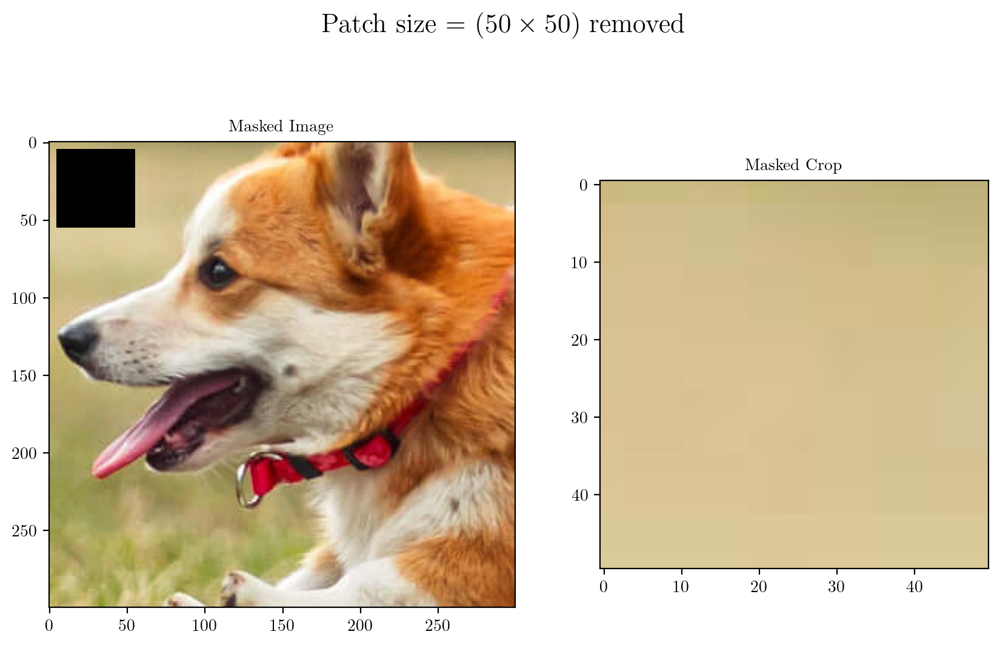

In [16]:
single50, crop50 = remove_patch(img_scaled, (5, 5), 50)

### **ITERATION RUN SINGLE**

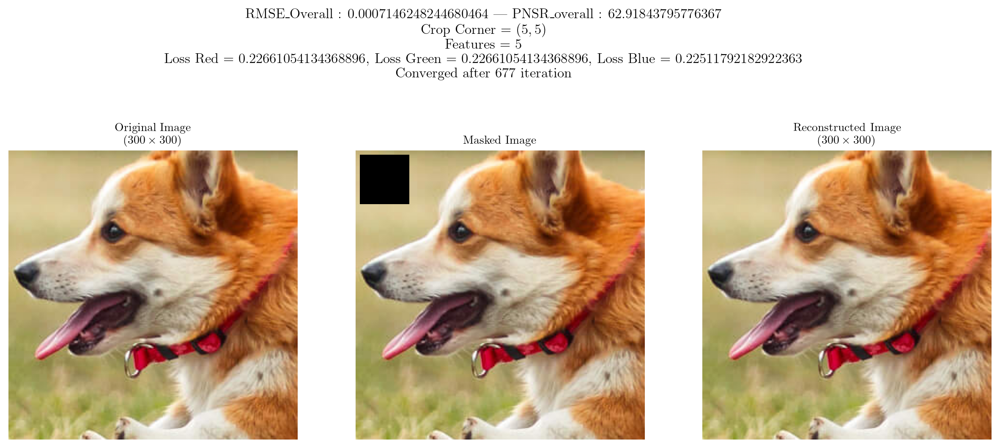

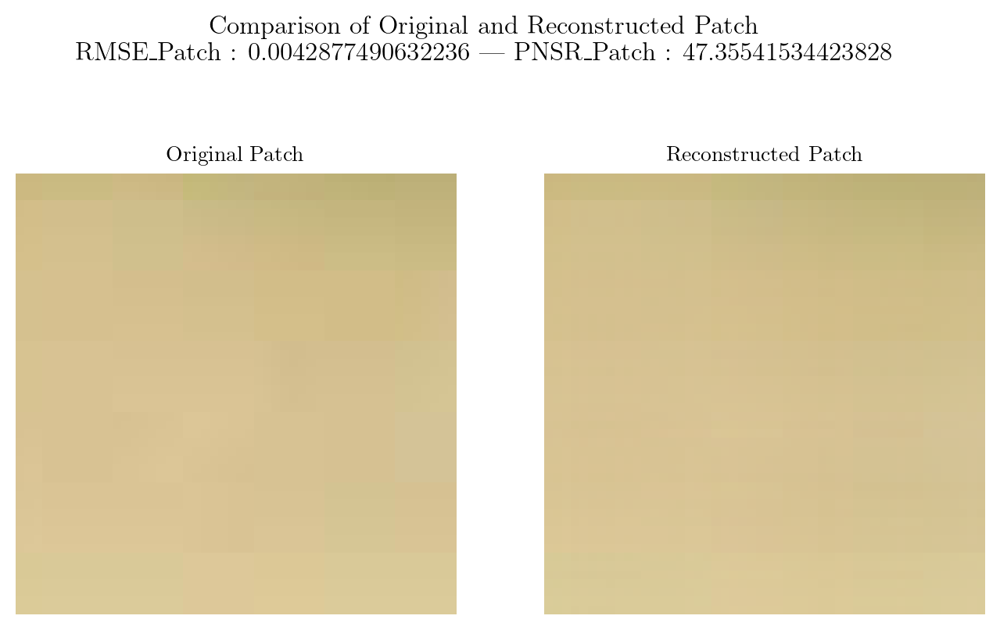

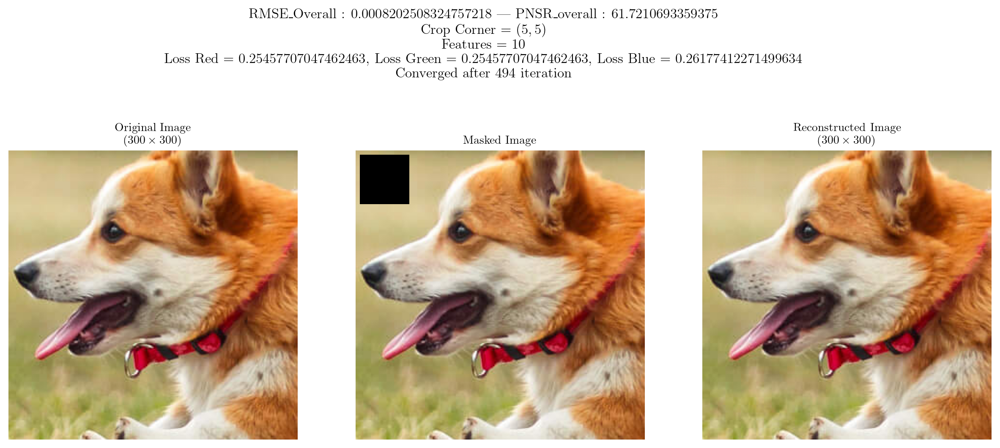

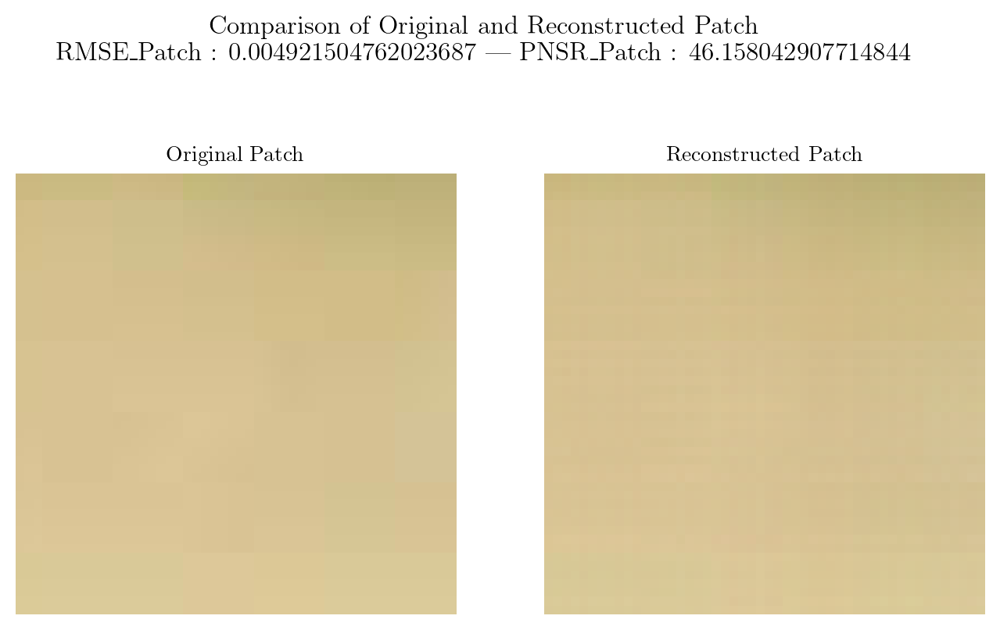

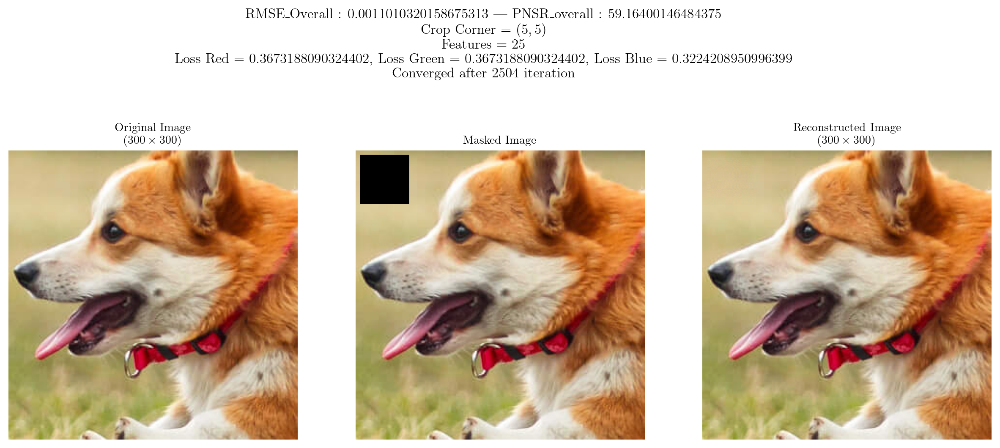

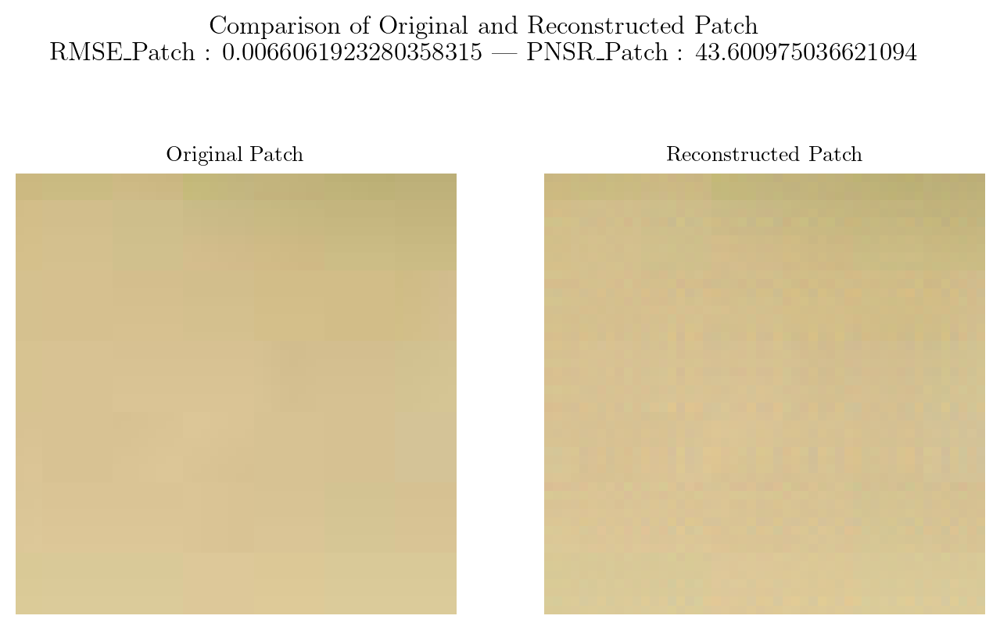

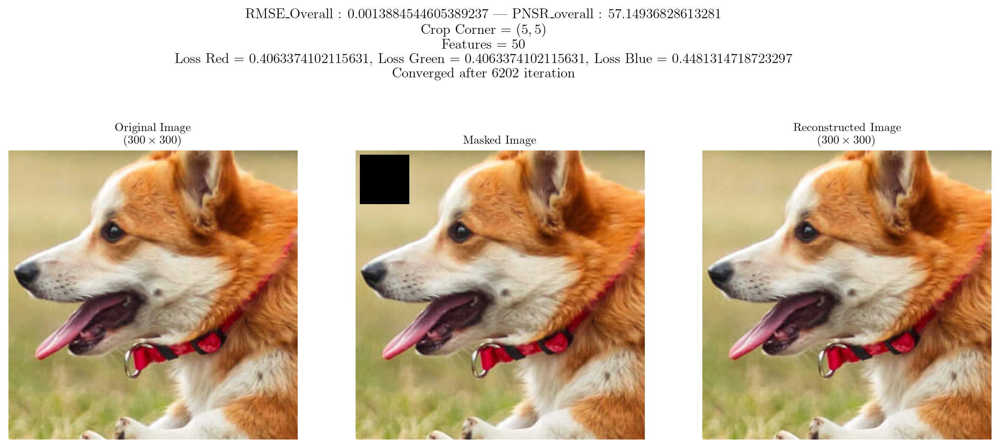

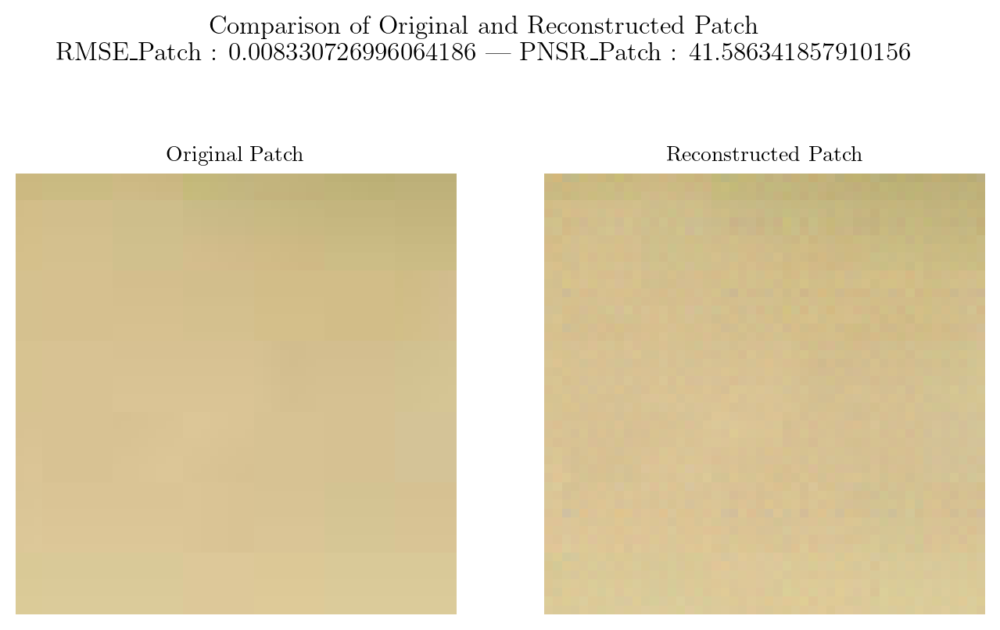

In [17]:
rmse1, psnr1 = [], []
rmse1_, psnr1_ = [], []
for i, features in enumerate(r):
  rmse, psnr, rmse_, psnr_ = train_reconstruct_plot_patch(img_scaled, (5, 5), 50, features, 1e-6, device, allowSave = True, FileName = f"Single{i + 1}.png", allowMetrics = True)
  rmse1.append(rmse)
  psnr1.append(psnr)
  rmse1_.append(rmse_)
  psnr1_.append(psnr_)

# **2 - 3 Colored Patch** $(50 \times 50)$

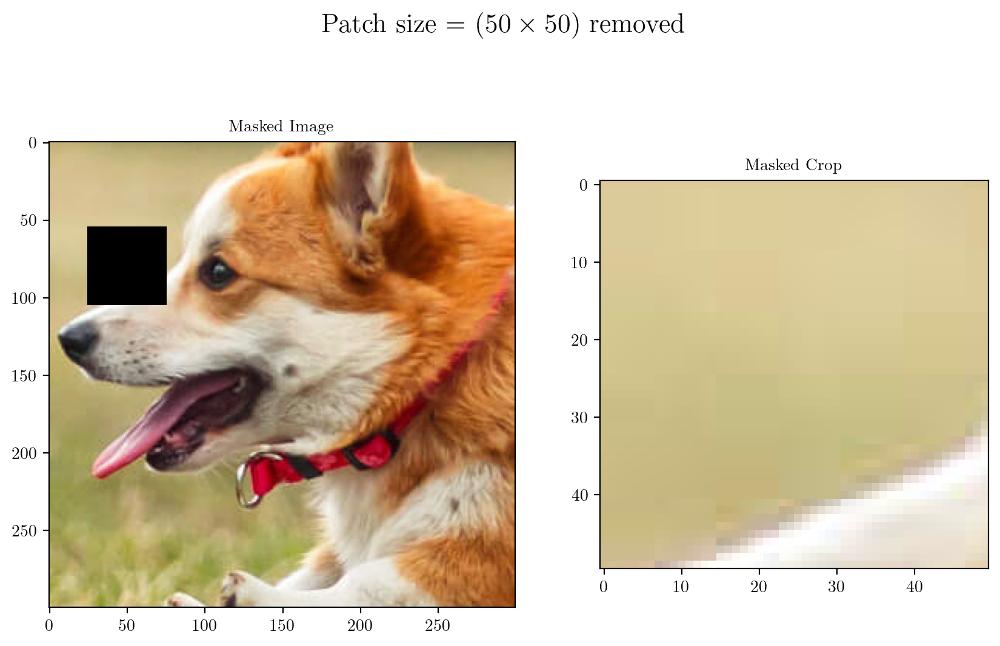

In [18]:
double50, cropDouble50 = remove_patch(img_scaled, (55, 25), 50)

### **ITERATION RUN DOUBLE**

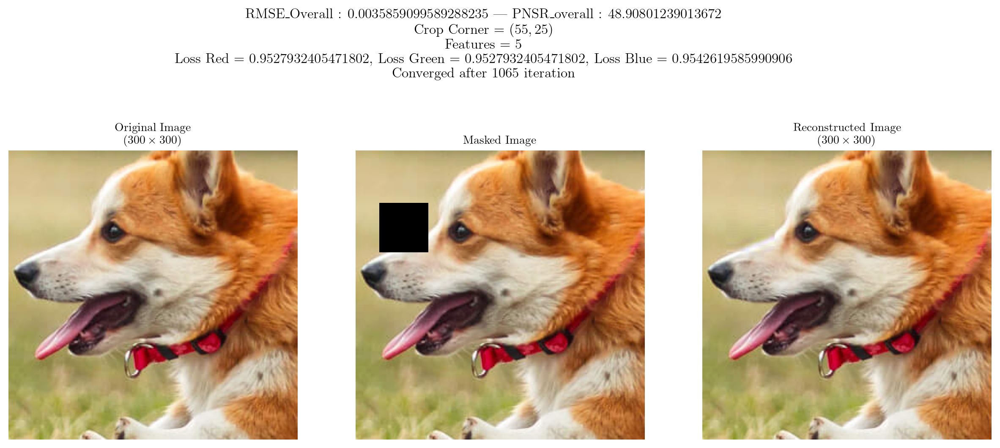

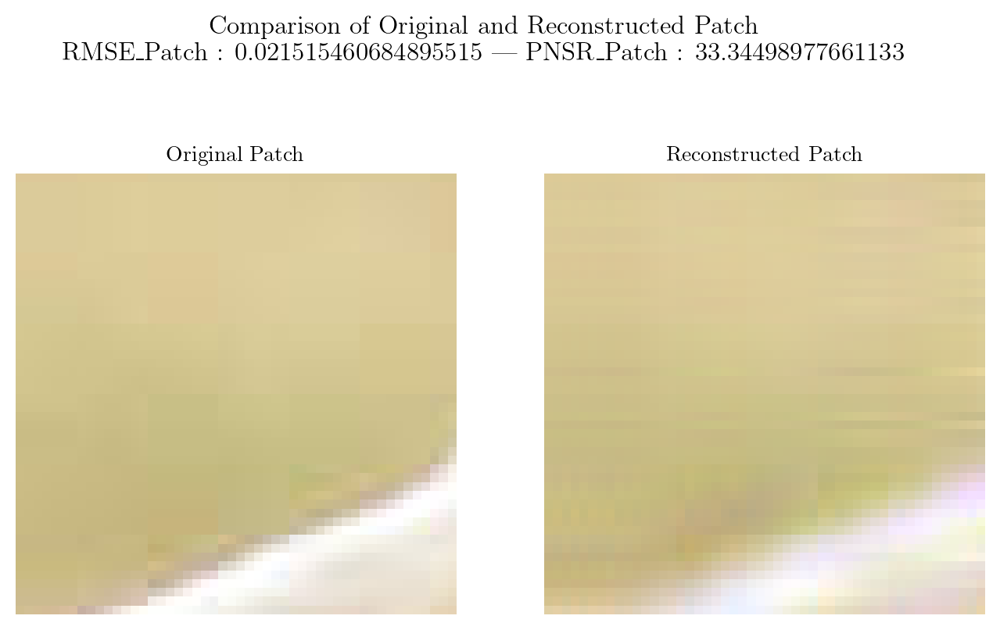

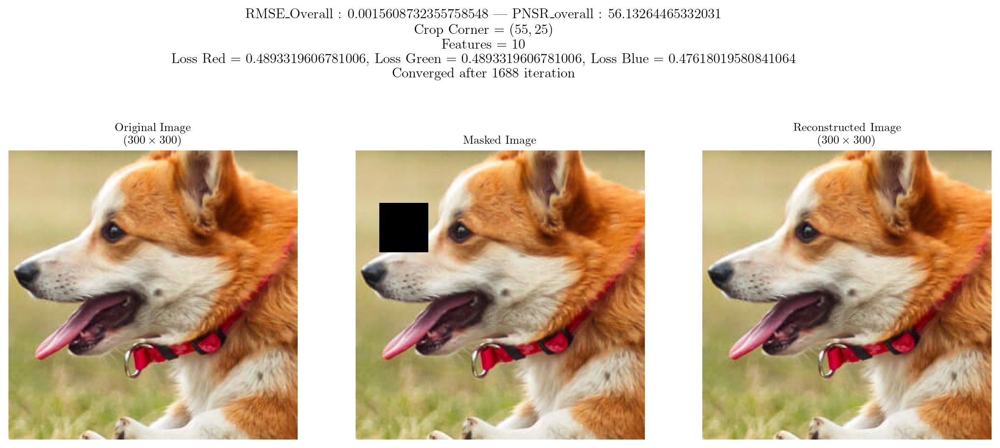

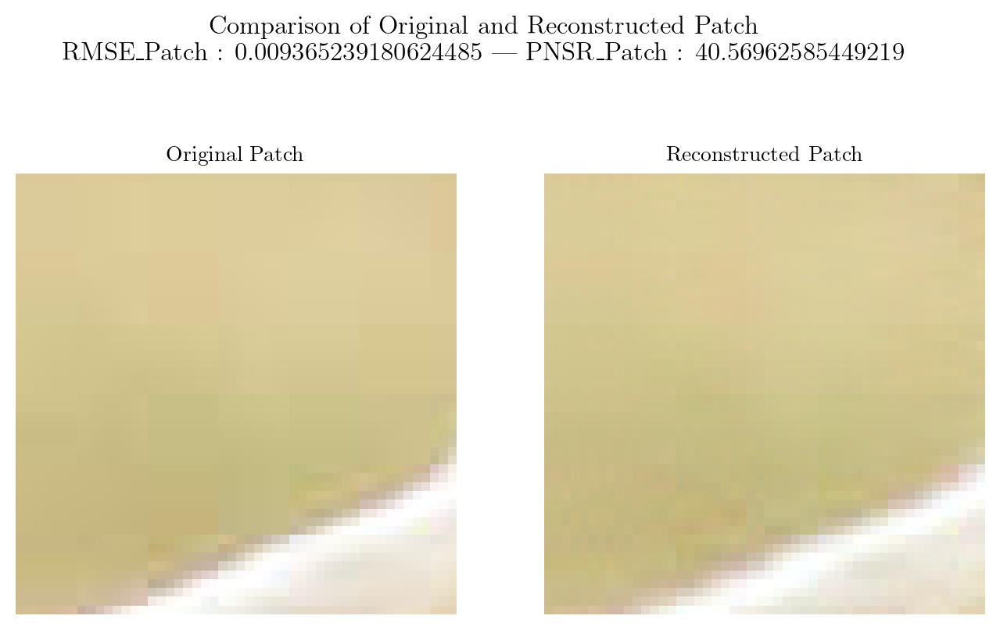

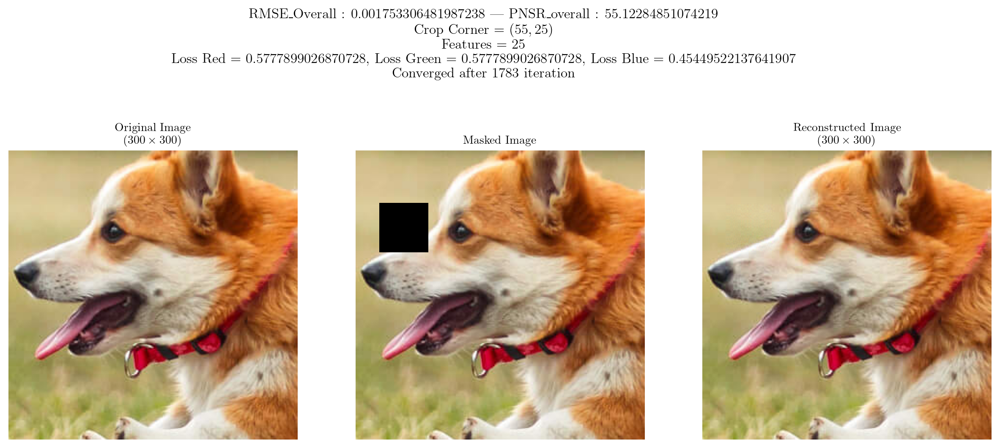

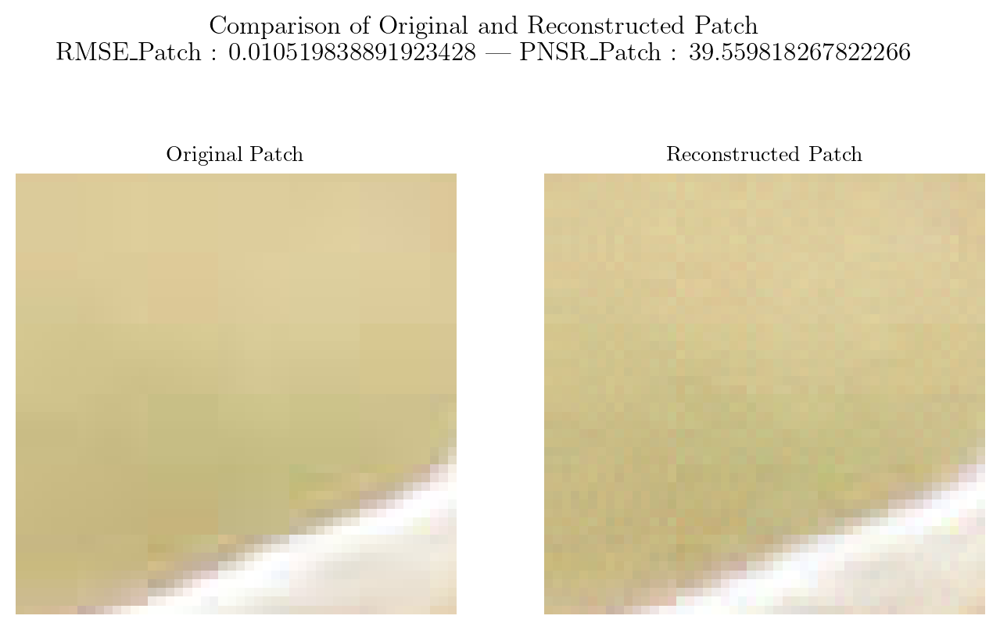

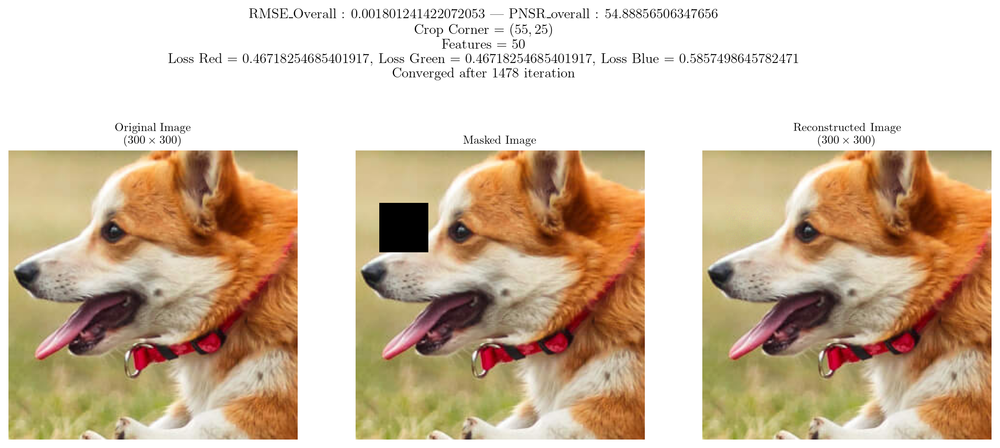

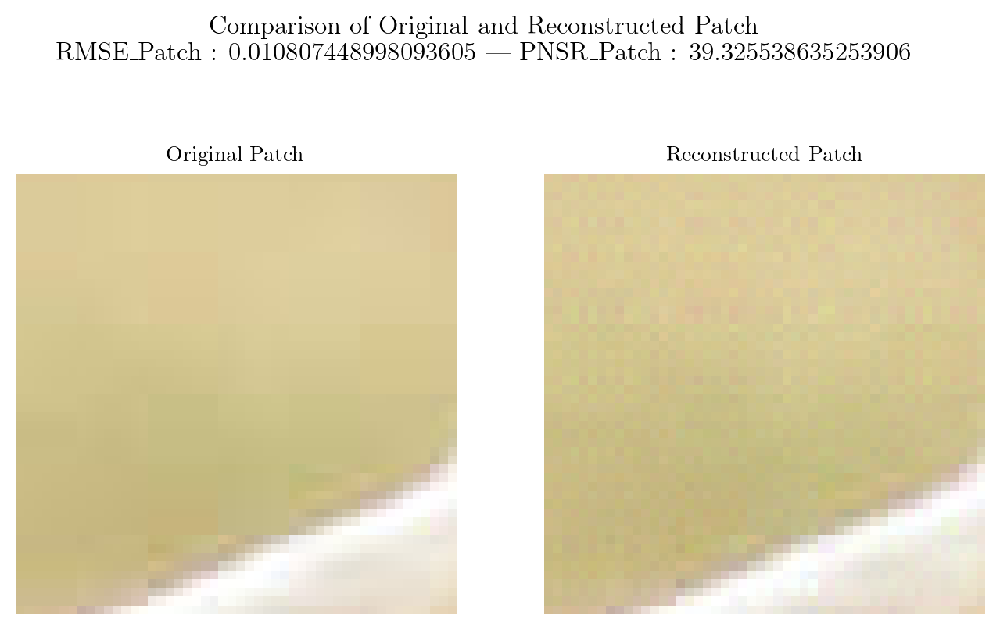

In [19]:
rmse2, psnr2 = [], []
rmse2_, psnr2_ = [], []
for i, features in enumerate(r):
  rmse, psnr, rmse_, psnr_ = train_reconstruct_plot_patch(img_scaled, (55, 25), 50, features, 1e-6, device, allowSave = True, FileName = f"Double{i + 1}.png", allowMetrics = True)
  rmse2.append(rmse)
  psnr2.append(psnr)
  rmse2_.append(rmse_)
  psnr2_.append(psnr_)

# **Multi-colored Patch** $(50 \times 50)$

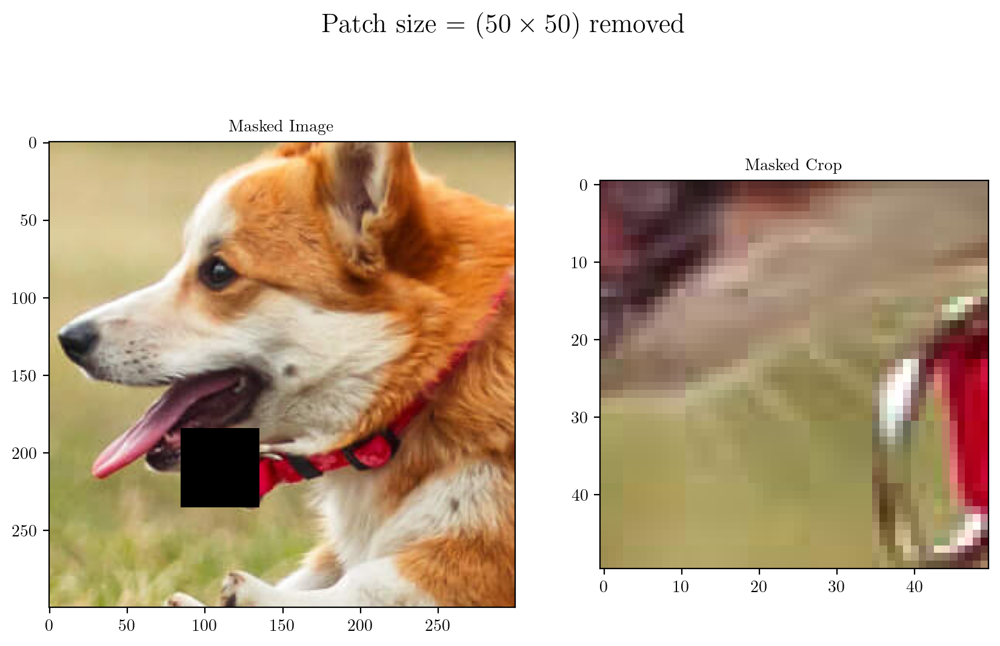

In [20]:
multi50, cropMulti50 = remove_patch(img_scaled, (185, 85), 50)

### **ITERATION RUN MULTI**

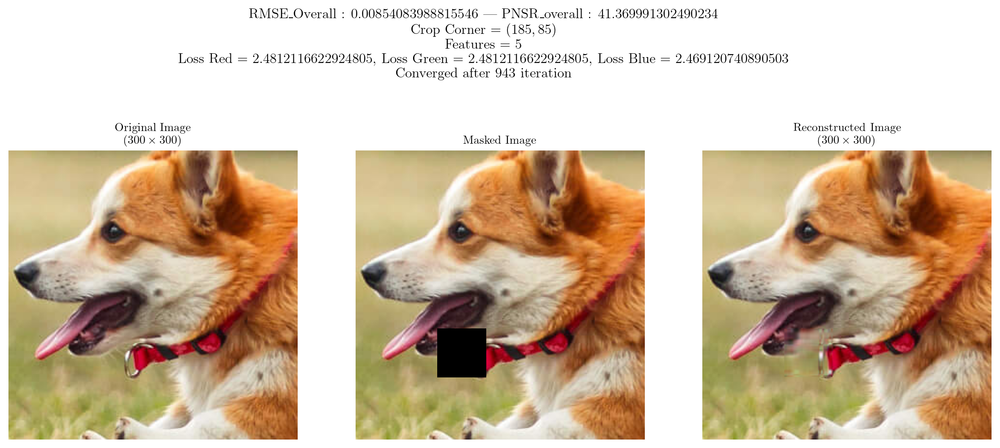

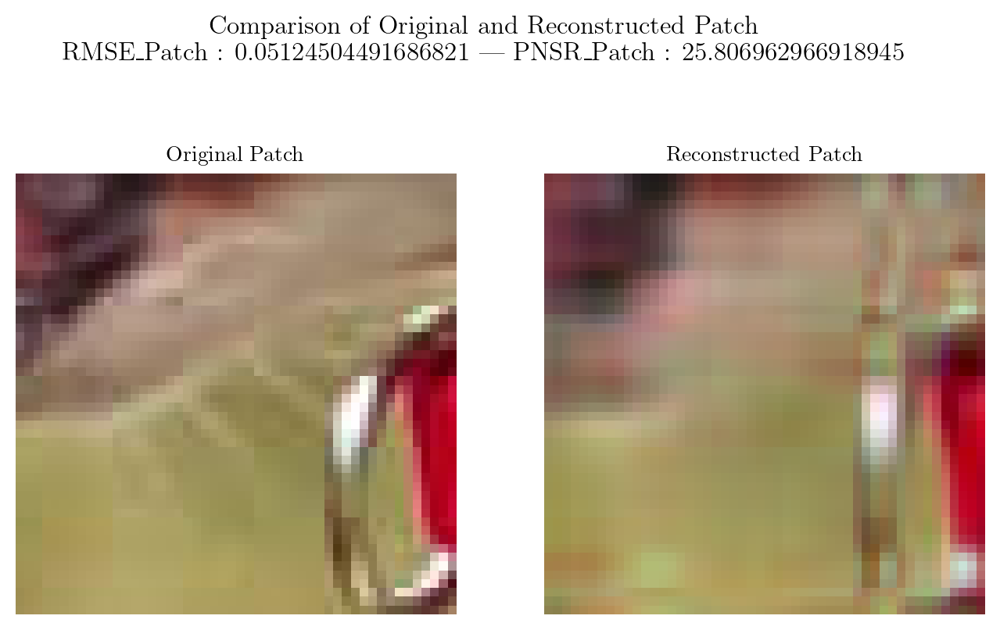

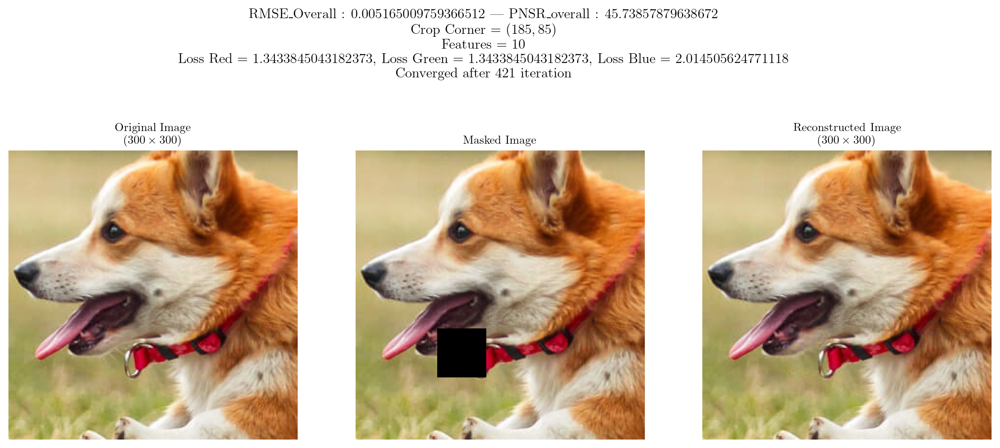

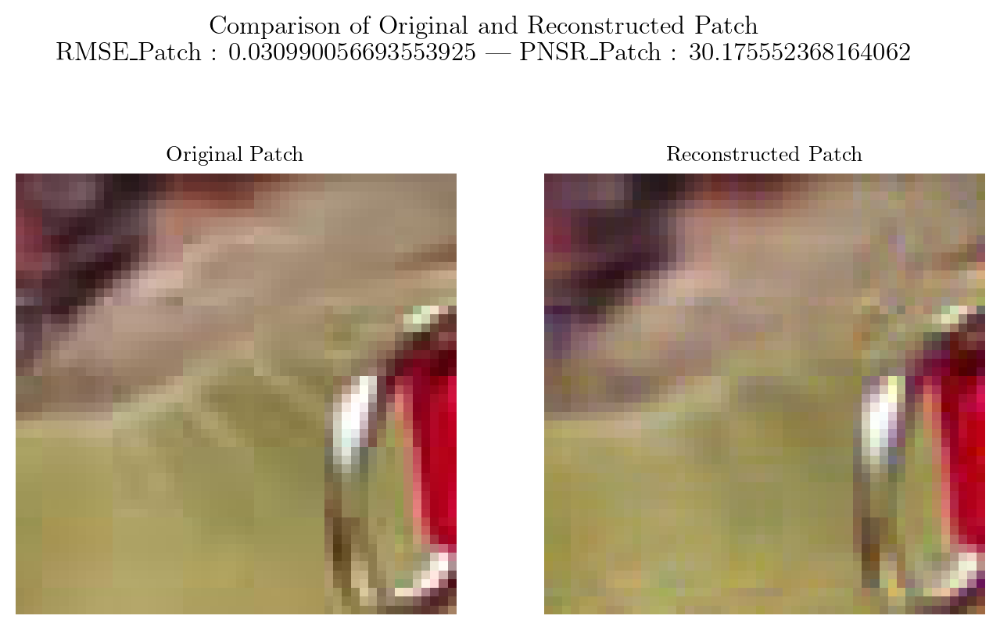

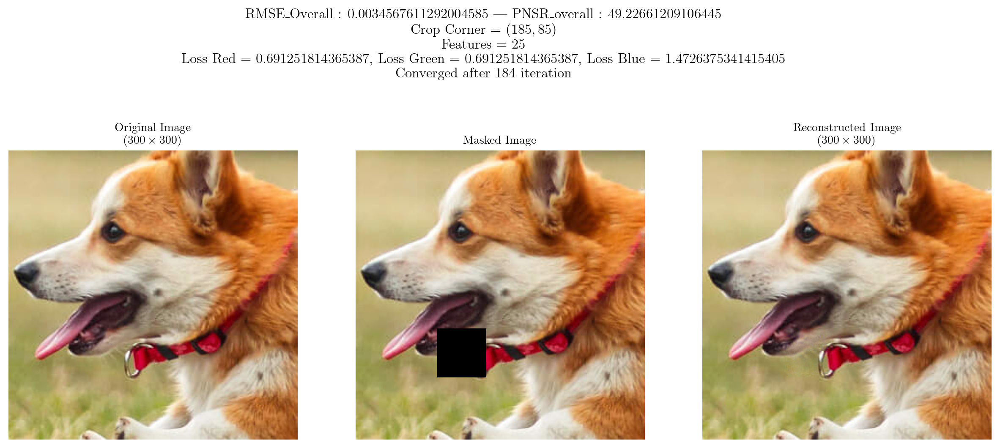

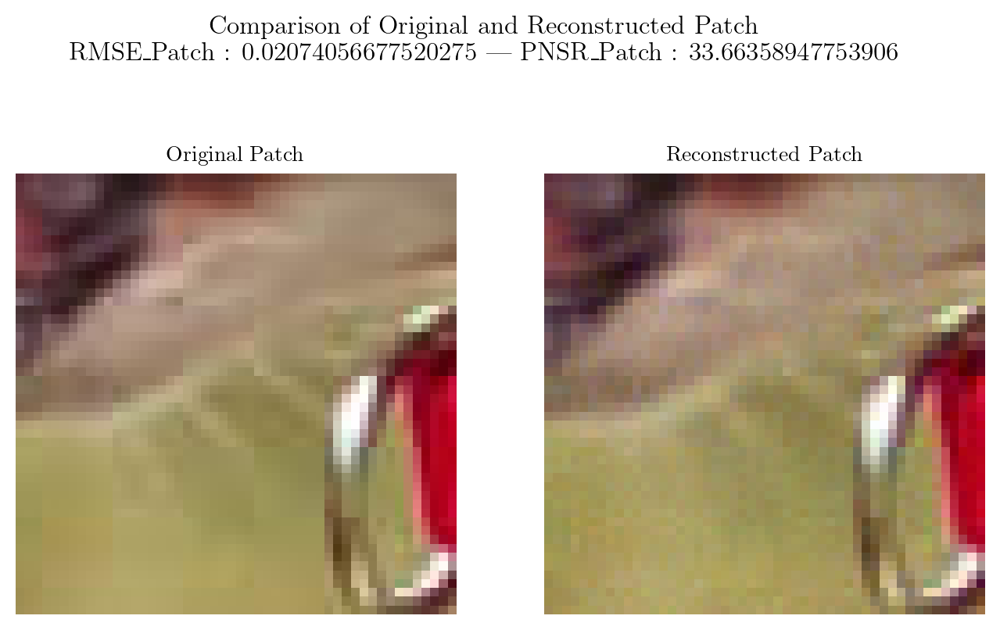

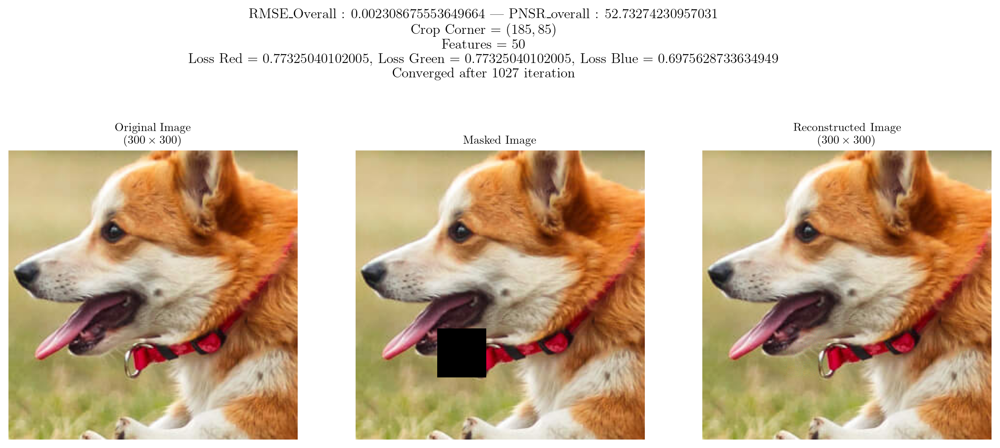

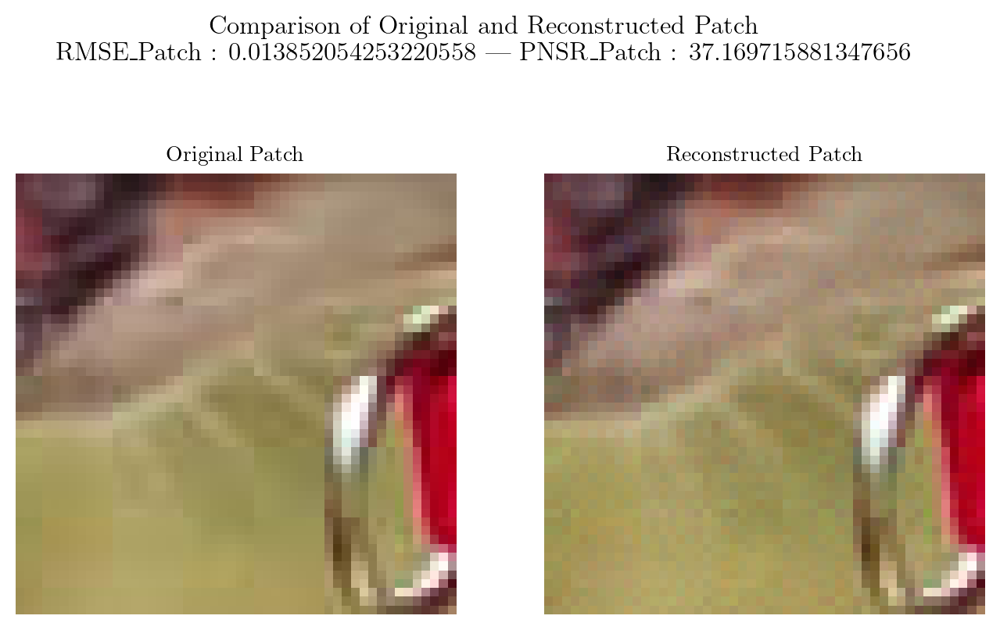

In [21]:
rmse3, psnr3 = [], []
rmse3_, psnr3_ = [], []
for i, features in enumerate(r):
  rmse, psnr, rmse_, psnr_ = train_reconstruct_plot_patch(img_scaled, (185, 85), 50, features, 1e-6, device, allowSave = True, FileName = f"Multi{i + 1}.png", allowMetrics = True)
  rmse3.append(rmse)
  psnr3.append(psnr)
  rmse3_.append(rmse_)
  psnr3_.append(psnr_)

# **PLOTS**

In [22]:
rm1 = [x.detach().cpu().numpy() for x in rmse1]
rm2 = [x.detach().cpu().numpy() for x in rmse2]
rm3 = [x.detach().cpu().numpy() for x in rmse3]
rm1_ = [x.detach().cpu().numpy() for x in rmse1_]
rm2_ = [x.detach().cpu().numpy() for x in rmse2_]
rm3_ = [x.detach().cpu().numpy() for x in rmse3_]

## **RMSE Plot for Entire Image**

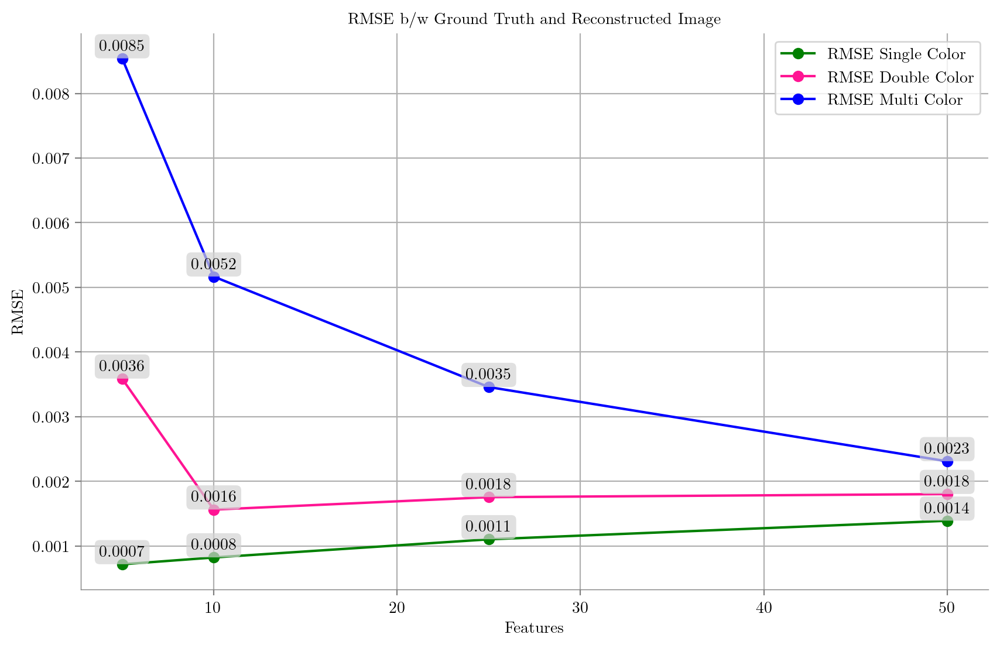

In [27]:
latexify(columns = 2, fig_width = 10)
plt.plot(r, rm1, marker = "o", label = "RMSE Single Color", color = "green")
plt.plot(r, rm2, marker = "o", label = "RMSE Double Color", color = "deeppink")
plt.plot(r, rm3, marker = "o", label = "RMSE Multi Color", color = "blue")
plt.xlabel(r"Features")
plt.ylabel("RMSE")
plt.title("RMSE b/w Ground Truth and Reconstructed Image")
plt.grid()
plt.legend()
format_axes(plt.gca())
for i, psnr in enumerate(rm1):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(rm2):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(rm3):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()

## **RMSE Plot for Patch**

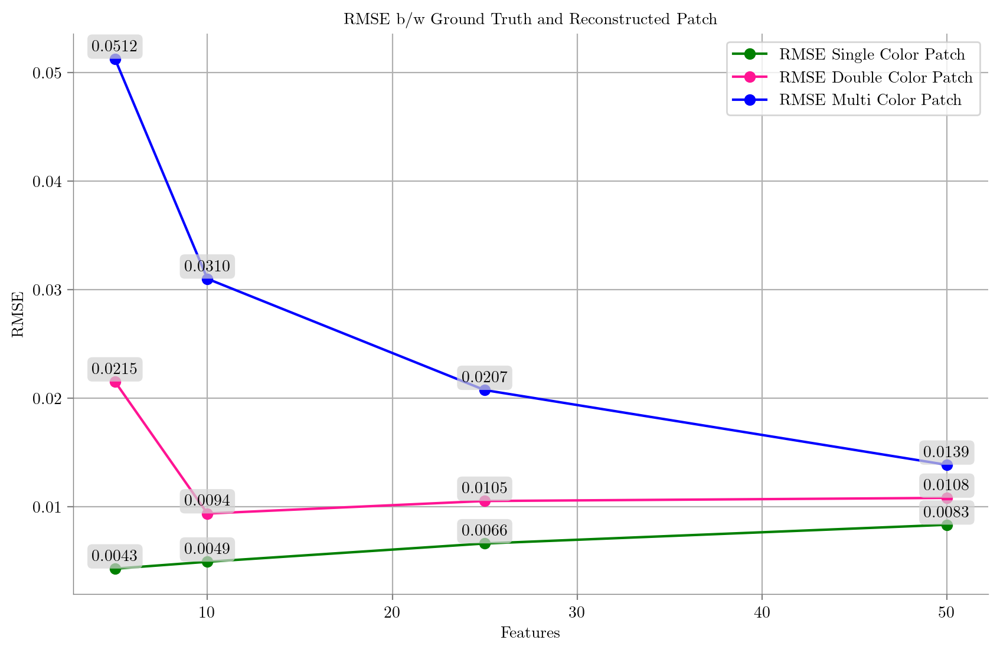

In [28]:
latexify(columns = 2, fig_width = 10)
plt.plot(r, rm1_, marker = "o", label = "RMSE Single Color Patch", color = "green")
plt.plot(r, rm2_, marker = "o", label = "RMSE Double Color Patch", color = "deeppink")
plt.plot(r, rm3_, marker = "o", label = "RMSE Multi Color Patch", color = "blue")
plt.xlabel(r"Features")
plt.ylabel("RMSE")
plt.title("RMSE b/w Ground Truth and Reconstructed Patch")
plt.grid()
plt.legend()
format_axes(plt.gca())
for i, psnr in enumerate(rm1_):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(rm2_):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(rm3_):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()

## **PSNR Plot for Entire Image**

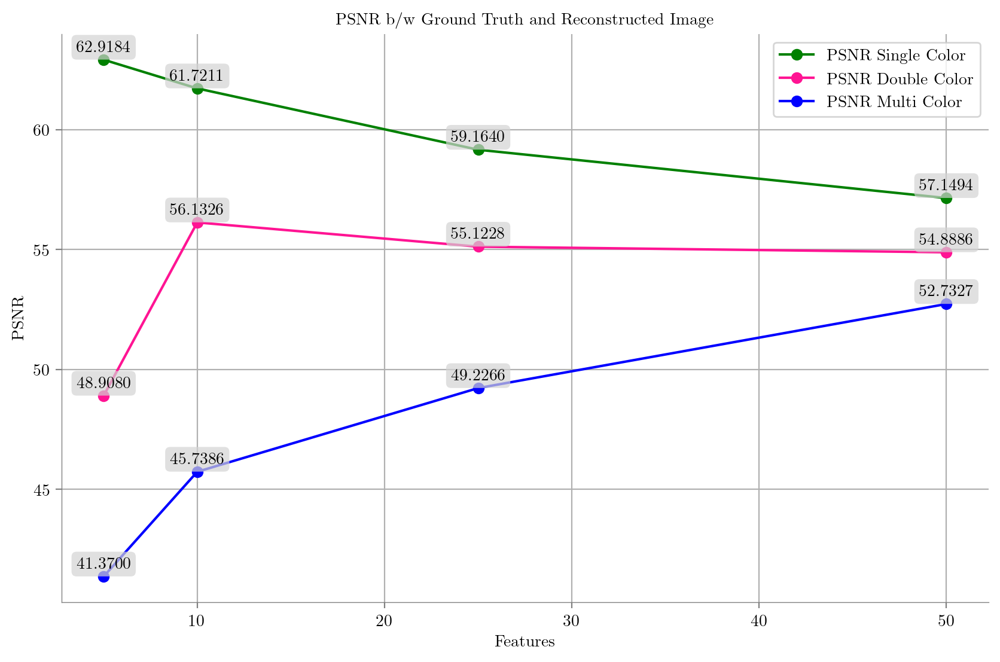

In [25]:
latexify(columns = 2, fig_width = 10)
plt.plot(r, psnr1, marker = "o", label = "PSNR Single Color", color = "green")
plt.plot(r, psnr2, marker = "o", label = "PSNR Double Color", color = "deeppink")
plt.plot(r, psnr3, marker = "o", label = "PSNR Multi Color", color = "blue")
plt.xlabel(r"Features")
plt.ylabel("PSNR")
plt.title("PSNR b/w Ground Truth and Reconstructed Image")
plt.grid()
plt.legend()
format_axes(plt.gca())
for i, psnr in enumerate(psnr1):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(psnr2):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(psnr3):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()

## **PSNR Plot for Patch**

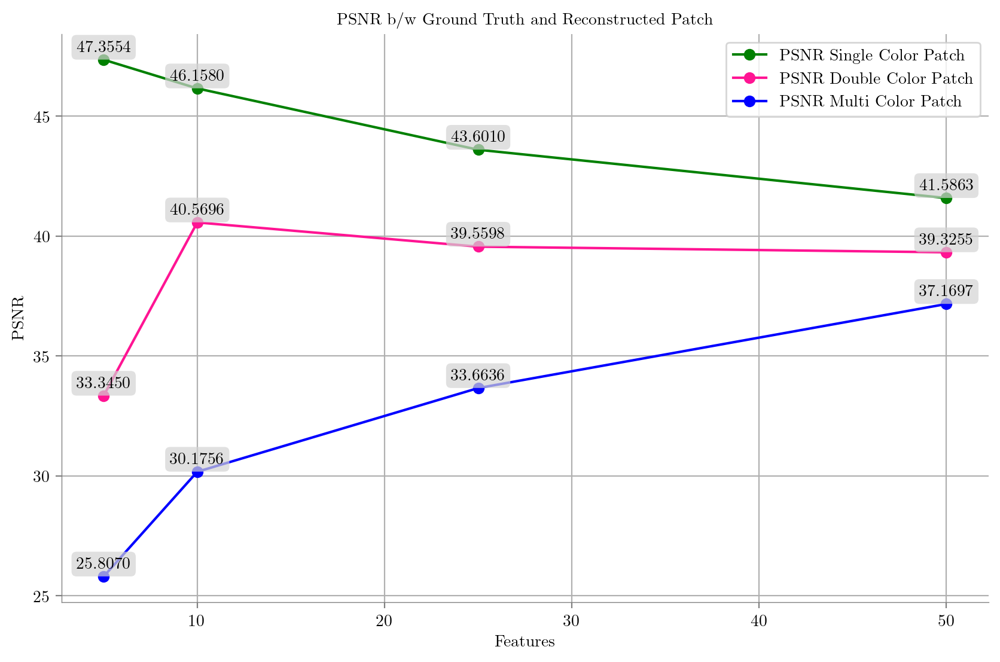

In [26]:
latexify(columns = 2, fig_width = 10)
plt.plot(r, psnr1_, marker = "o", label = "PSNR Single Color Patch", color = "green")
plt.plot(r, psnr2_, marker = "o", label = "PSNR Double Color Patch", color = "deeppink")
plt.plot(r, psnr3_, marker = "o", label = "PSNR Multi Color Patch", color = "blue")
plt.xlabel(r"Features")
plt.ylabel("PSNR")
plt.title("PSNR b/w Ground Truth and Reconstructed Patch")
plt.grid()
plt.legend()
format_axes(plt.gca())
for i, psnr in enumerate(psnr1_):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(psnr2_):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))

for i, psnr in enumerate(psnr3_):
    plt.annotate(f'{psnr:.4f}', (r[i], psnr), textcoords="offset points", xytext=(0, 5), ha="center",
                 bbox=dict(boxstyle='round,pad=0.3', edgecolor='none', facecolor='lightgray', alpha=0.7))
plt.show()